In [1]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random, gc, os, pickle

%matplotlib inline

# Original Dataset

In [2]:
# Load the data
train_all = pd.read_csv('./data/all/train.csv')
test_all = pd.read_csv('./data/all/test.csv')

print('Train:\t\t', train_all.shape)
print('Test:\t\t', test_all.shape)

print('Landmarks:\t', len(train_all['landmark_id'].unique()))

Train:		 (1225029, 3)
Test:		 (117703, 2)
Landmarks:	 14951


In [3]:
train_all.head()

,id,url,landmark_id
0,cacf8152e2d2ae60,http://static.panoramio.com/photos/original/70...,4676
1,0a58358a2afd3e4e,http://lh6.ggpht.com/-igpT6wu0mIA/ROV8HnUuABI/...,6651
2,6b2bb500b6a38aa0,http://lh6.ggpht.com/-vKr5G5MEusk/SR6r6SJi6mI/...,11284
3,b399f09dee9c3c67,https://lh3.googleusercontent.com/-LOW2cjAqubA...,8429
4,19ace29d77a5be66,https://lh5.googleusercontent.com/-tnmSXwQcWL8...,6231


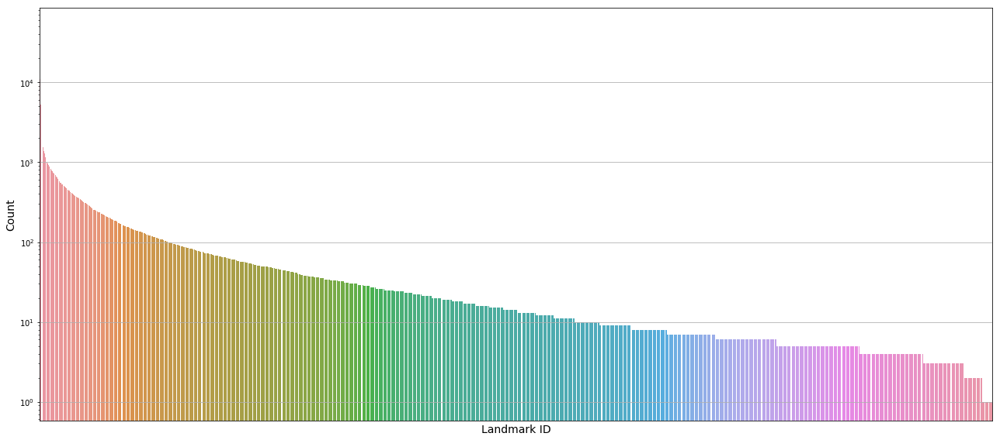

In [4]:
# Group data according unique landmark_id
grouped = train_all[['landmark_id', 'id']].groupby('landmark_id').count().reset_index()
grouped = grouped.sort_values('id', ascending=False)
grouped = grouped.rename(columns={'id': 'count'}).reset_index(drop=True)
order = grouped['landmark_id'].values

# Visualize the distribution of landmark ids
fig, ax = plt.subplots(figsize=(18, 8))
sns.countplot(x='landmark_id', data=train_all, order=order)
ax.set_xticks([])
ax.set_yscale('log')
ax.grid(True)
ax.set_xlabel('Landmark ID', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
plt.tight_layout()
fig.savefig('./result/images/all_data_countplot.pdf')
fig.savefig('./result/images/all_data_countplot.png', dpi=200)
plt.show()

# Subset Dataset

In [4]:
train_df = pd.read_csv('./data/triplet/train.csv')
val_df = pd.read_csv('./data/triplet/validation.csv')
test_df = pd.read_csv('./data/triplet/test.csv')

print('Train:\t\t', train_df.shape)
print('Validation:\t', val_df.shape)
print('Test:\t\t', test_df.shape)

print('\nTrain Landmarks:\t', len(train_df['landmark_id'].unique()))
print('Validation Landmarks:\t', len(val_df['landmark_id'].unique()))
print('Test Landmarks:\t\t', len(test_df['landmark_id'].unique()))

Train:		 (113783, 4)
Validation:	 (22255, 4)
Test:		 (22391, 4)

Train Landmarks:	 14943
Validation Landmarks:	 7674
Test Landmarks:		 14436


In [5]:
train_df.head()

,image_id,id,url,landmark_id
0,465272,a2ccf8ed2e969f6a,https://lh4.googleusercontent.com/-TPHkS5gzvm4...,0
1,64516,e205ca7c8dd7c027,https://lh3.googleusercontent.com/-V3RjsZtGpxE...,0
2,928409,4e8ab93c1620e8a3,http://mw2.google.com/mw-panoramio/photos/medi...,0
3,88809,896bf928214d1ca4,http://lh5.ggpht.com/-Cy0l41uUaGA/R--yB8vy41I/...,0
4,1001133,375d2a153bdca926,http://lh6.ggpht.com/-UqzFpnqE9bU/S_0u1RovfdI/...,0


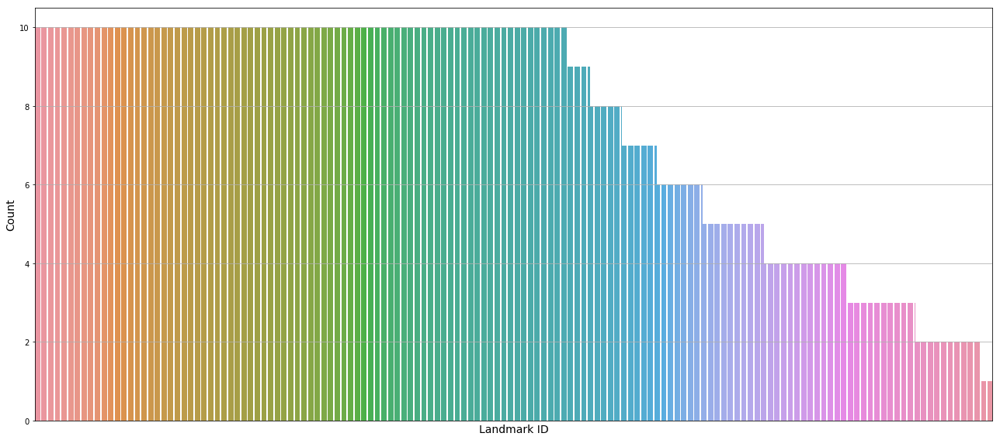

In [7]:
# Group data according unique landmark_id
grouped = train_df[['landmark_id', 'id']].groupby('landmark_id').count().reset_index()
grouped = grouped.sort_values('id', ascending=False)
grouped = grouped.rename(columns={'id': 'count'}).reset_index(drop=True)
order = grouped['landmark_id'].values

# Visualize the distribution of landmark ids
fig, ax = plt.subplots(figsize=(18, 8))
sns.countplot(x='landmark_id', data=train_df, order=order)
ax.set_xticks([])
ax.set_xlabel('Landmark ID', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
ax.grid(True)
plt.tight_layout()
fig.savefig('./result/images/subset_countplot.pdf')
fig.savefig('./result/images/subset_countplot.png', dpi=200)
plt.show()

# Sample Image Visualization

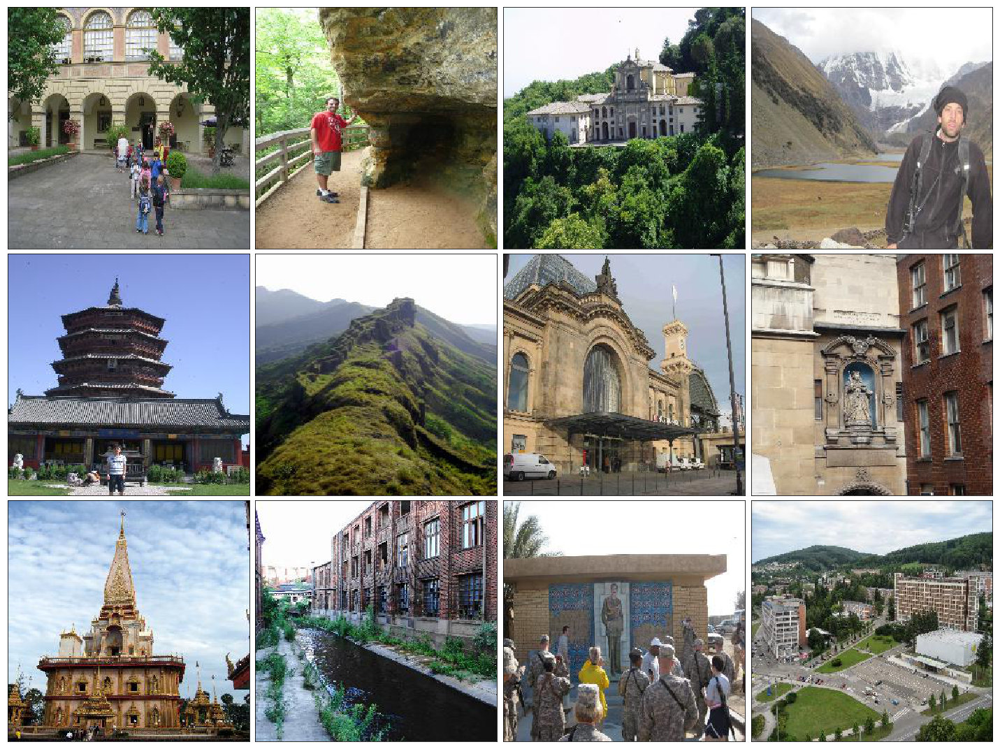

In [11]:
np.random.seed(2)
idxs = np.random.choice(range(len(train_df)), 12, replace=False)

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))
for i in range(len(idxs)):
    img_id = train_df.loc[idxs[i], 'image_id']
    img = plt.imread('./data/triplet/train/' + str(img_id) + '.jpg')
    ax[i // 4][i % 4].imshow(img)
    ax[i // 4][i % 4].set_xticks([])
    ax[i // 4][i % 4].set_yticks([])
    ax[i // 4][i % 4].axis('image')
plt.tight_layout(pad=1.08, h_pad=0, w_pad=0)
fig.savefig('./result/images/sample_img.pdf')
fig.savefig('./result/images/sample_img.png', dpi=200)
plt.show()

# Load Model Accuracy

In [11]:
random_guess_acc = np.load('./result/random_guess_accuracy.npy')

knn_naive_vgg_acc = np.load('./result/knn_naive_vgg16_accuracy.npy')
triplet_vgg_01_acc = np.load('./result/knn-triplet-vgg16-0.1-accuracy.npy')
triplet_vgg_02_acc = np.load('./result/knn-triplet-vgg16-0.2-accuracy.npy')
triplet_vgg_03_acc = np.load('./result/knn-triplet-vgg16-0.3-accuracy.npy')
triplet_vgg_04_acc = np.load('./result/knn-triplet-vgg16-0.4-accuracy.npy')
triplet_vgg_05_acc = np.load('./result/knn-triplet-vgg16-0.5-accuracy.npy')

knn_naive_inception_acc = np.load('./result/knn_naive_inceptionV3_accuracy.npy')
triplet_inception_01_acc = np.load('./result/knn-triplet-inception-0.1-accuracy.npy')
triplet_inception_02_acc = np.load('./result/knn-triplet-inception-0.2-accuracy.npy')
triplet_inception_03_acc = np.load('./result/knn-triplet-inception-0.3-accuracy.npy')
triplet_inception_04_acc = np.load('./result/knn-triplet-inception-0.4-accuracy.npy')
triplet_inception_05_acc = np.load('./result/knn-triplet-inception-0.5-accuracy.npy')

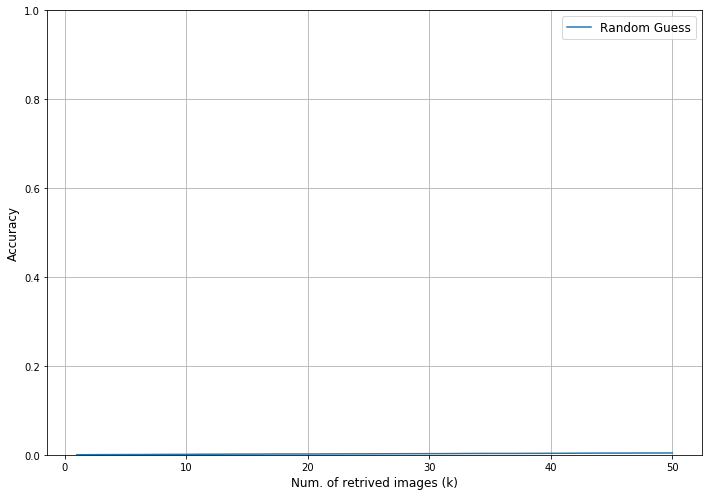

In [12]:
fig, ax = plt.subplots(figsize=(10, 7))
l1, = ax.plot(range(1, len(random_guess_acc) + 1), random_guess_acc, label='Random Guess')
ax.set_ylim([0, 1])
ax.set_xlabel('Num. of retrived images (k)', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.legend(fontsize=12, handles=[l1])
ax.grid(True)
plt.tight_layout()
fig.savefig('./result/images/accuracy_1.pdf')
plt.show()

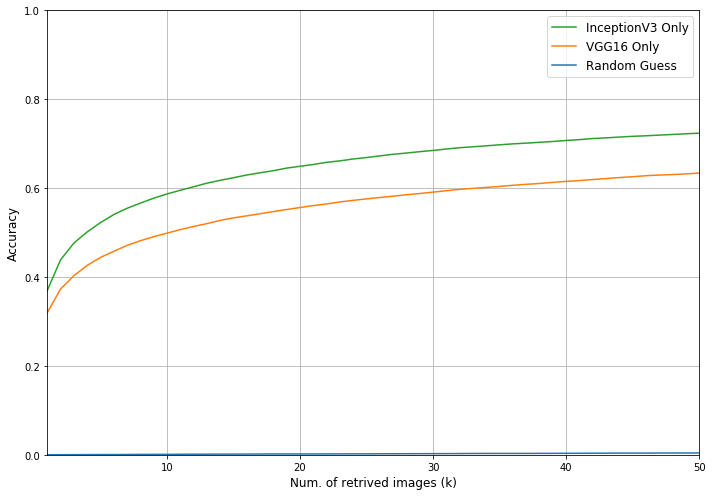

In [13]:
fig, ax = plt.subplots(figsize=(10, 7))
l1, = ax.plot(range(1, 51), random_guess_acc, label='Random Guess')
l2, = ax.plot(range(1, 51), knn_naive_vgg_acc, label='VGG16 Only')
l3, = ax.plot(range(1, 51), knn_naive_inception_acc, label='InceptionV3 Only')
ax.set_ylim([0, 1])
ax.set_xlim([1, 50])
ax.set_xlabel('Num. of retrived images (k)', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.legend(fontsize=12, handles=[l3, l2, l1])
ax.grid(True)
plt.tight_layout()
fig.savefig('./result/images/accuracy_2.pdf')
plt.show()

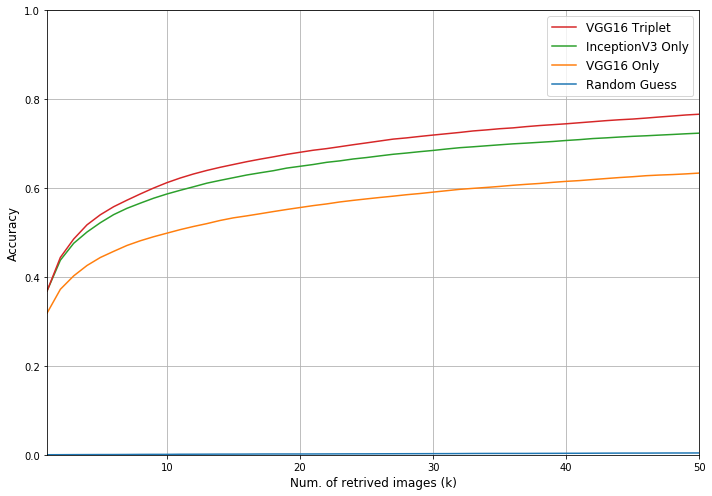

In [14]:
fig, ax = plt.subplots(figsize=(10, 7))
l1, = ax.plot(range(1, 51), random_guess_acc, label='Random Guess')
l2, = ax.plot(range(1, 51), knn_naive_vgg_acc, label='VGG16 Only')
l3, = ax.plot(range(1, 51), knn_naive_inception_acc, label='InceptionV3 Only')
l4, = ax.plot(range(1, 51), triplet_vgg_02_acc, label='VGG16 Triplet')
ax.set_ylim([0, 1])
ax.set_xlim([1, 50])
ax.set_xlabel('Num. of retrived images (k)', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.legend(fontsize=12, handles=[l4, l3, l2, l1])
ax.grid(True)
plt.tight_layout()
fig.savefig('./result/images/accuracy_3.pdf')
plt.show()

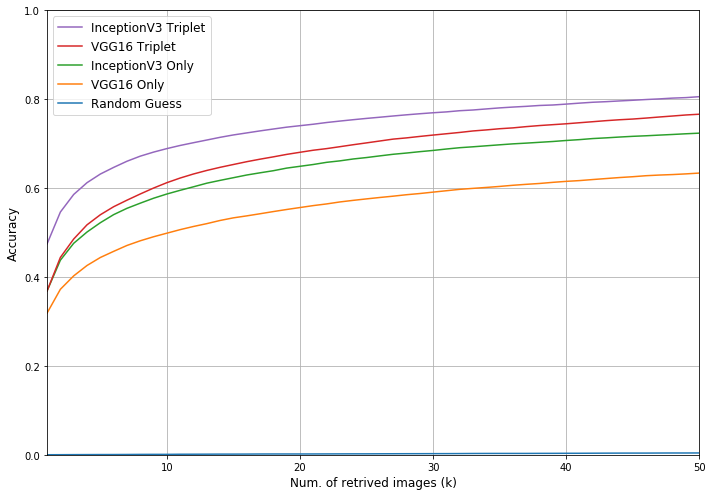

In [15]:
fig, ax = plt.subplots(figsize=(10, 7))
l1, = ax.plot(range(1, 51), random_guess_acc, label='Random Guess')
l2, = ax.plot(range(1, 51), knn_naive_vgg_acc, label='VGG16 Only')
l3, = ax.plot(range(1, 51), knn_naive_inception_acc, label='InceptionV3 Only')
l4, = ax.plot(range(1, 51), triplet_vgg_02_acc, label='VGG16 Triplet')
l5, = ax.plot(range(1, 51), triplet_inception_01_acc, label='InceptionV3 Triplet')
ax.set_ylim([0, 1])
ax.set_xlim([1, 50])
ax.set_xlabel('Num. of retrived images (k)', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.legend(fontsize=12, handles=[l5, l4, l3, l2, l1])
ax.grid(True)
plt.tight_layout()
fig.savefig('./result/images/accuracy_4.pdf')
plt.show()

# Load Model Prediction

In [16]:
distance = np.load('./result/knn-triplet-inception-0.1-distance.npy')
neighbor = np.load('./result/knn-triplet-inception-0.1-neighbor.npy')
prediction = np.load('./result/knn-triplet-inception-0.1-test-prediction.npy')

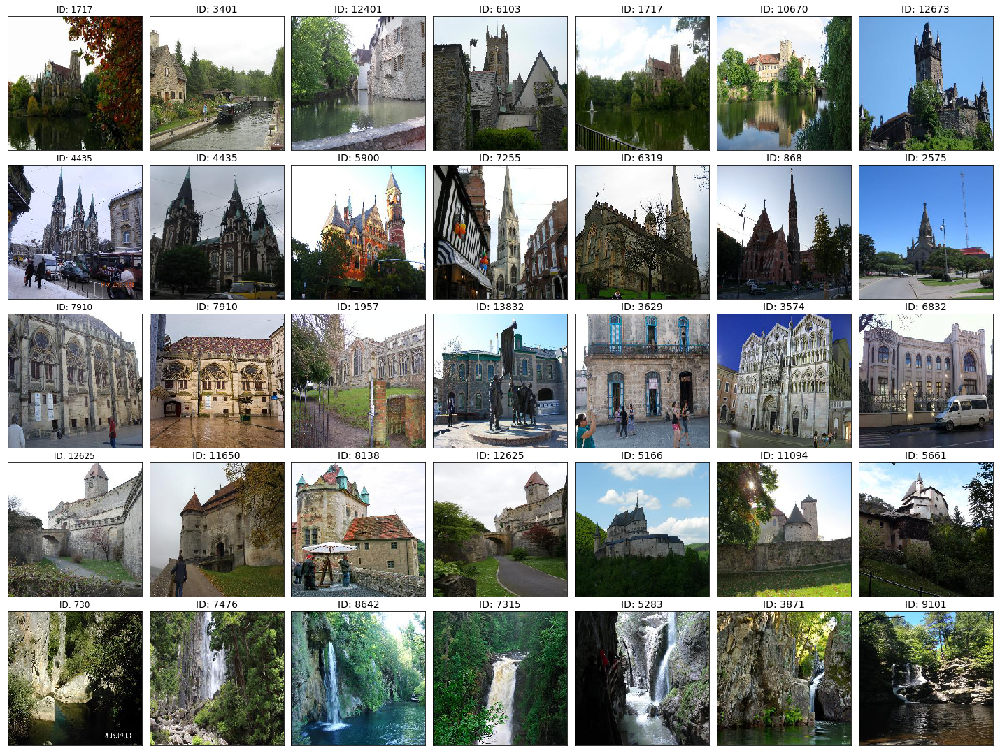

In [24]:
np.random.seed(2)
idxs = np.random.choice(range(len(test_df)), 10)

train_val_df = pd.concat((train_df, val_df), axis=0)
train_val_df = train_val_df.reset_index(drop=True)

# visualization
nrows = 5
ncols = 7
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
for i in range(nrows):
    index = idxs[i]
    test_img_id = test_df.loc[index, 'image_id']
    test_land_id = test_df.loc[index, 'landmark_id']
    test_img = plt.imread('./data/triplet/test/' + str(test_img_id) + '.jpg')
    ax[i][0].imshow(test_img)
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].axis('image')
    ax[i][0].set_title('ID: ' + str(test_land_id))
    neighbor_index = neighbor[index]
    for j in range(ncols - 1):
        tmp_img_id = train_val_df.loc[neighbor_index[j], 'image_id']
        tmp_land_id = train_val_df.loc[neighbor_index[j], 'landmark_id']
        if neighbor_index[j] < len(train_df):
            tmp_img = plt.imread('./data/triplet/train/' + str(tmp_img_id) + '.jpg')
        else:
            tmp_img = plt.imread('./data/triplet/validation/' + str(tmp_img_id) + '.jpg')
        ax[i][j + 1].imshow(tmp_img)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].axis('image')
        ax[i][j + 1].set_title('ID: ' + str(tmp_land_id), fontsize=14)
    
plt.tight_layout(pad=1, h_pad=0.5, w_pad=0)
fig.savefig('./result/images/result_1.pdf')
fig.savefig('./result/images/result_1.png', dpi=200)
plt.show()

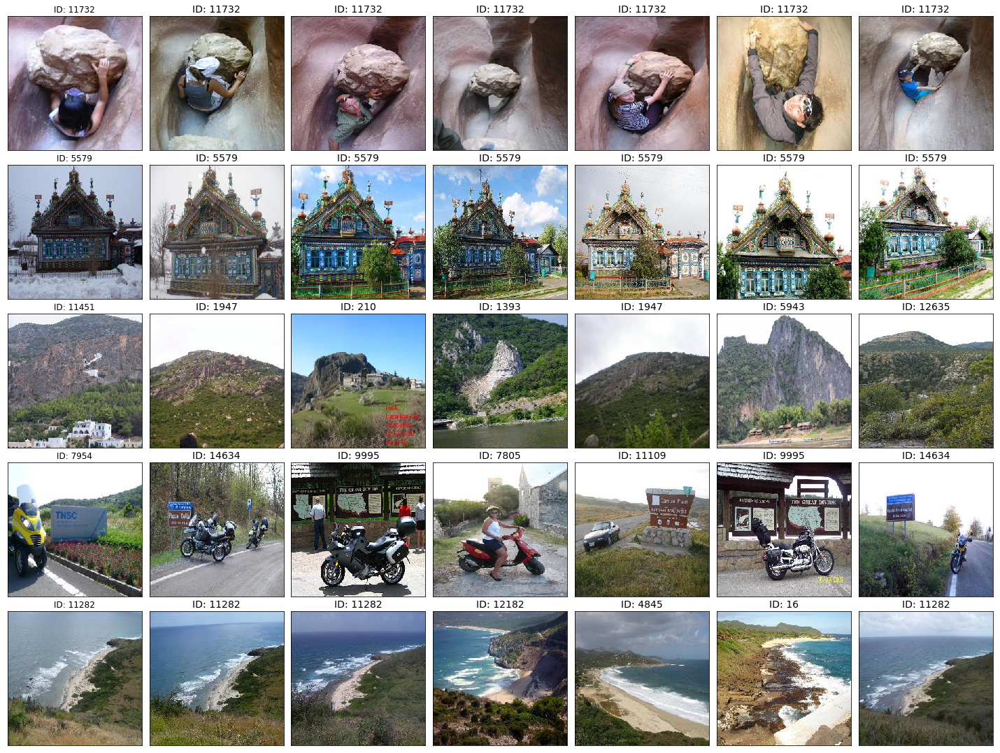

In [25]:
np.random.seed(4)
idxs = np.random.choice(range(len(test_df)), 10)

train_val_df = pd.concat((train_df, val_df), axis=0)
train_val_df = train_val_df.reset_index(drop=True)

# visualization
nrows = 5
ncols = 7
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
for i in range(nrows):
    index = idxs[i]
    test_img_id = test_df.loc[index, 'image_id']
    test_land_id = test_df.loc[index, 'landmark_id']
    test_img = plt.imread('./data/triplet/test/' + str(test_img_id) + '.jpg')
    ax[i][0].imshow(test_img)
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].axis('image')
    ax[i][0].set_title('ID: ' + str(test_land_id))
    neighbor_index = neighbor[index]
    for j in range(ncols - 1):
        tmp_img_id = train_val_df.loc[neighbor_index[j], 'image_id']
        tmp_land_id = train_val_df.loc[neighbor_index[j], 'landmark_id']
        if neighbor_index[j] < len(train_df):
            tmp_img = plt.imread('./data/triplet/train/' + str(tmp_img_id) + '.jpg')
        else:
            tmp_img = plt.imread('./data/triplet/validation/' + str(tmp_img_id) + '.jpg')
        ax[i][j + 1].imshow(tmp_img)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].axis('image')
        ax[i][j + 1].set_title('ID: ' + str(tmp_land_id), fontsize=14)
    
plt.tight_layout(pad=1, h_pad=0.5, w_pad=0)
fig.savefig('./result/images/result_2.pdf')
fig.savefig('./result/images/result_2.png', dpi=200)
plt.show()

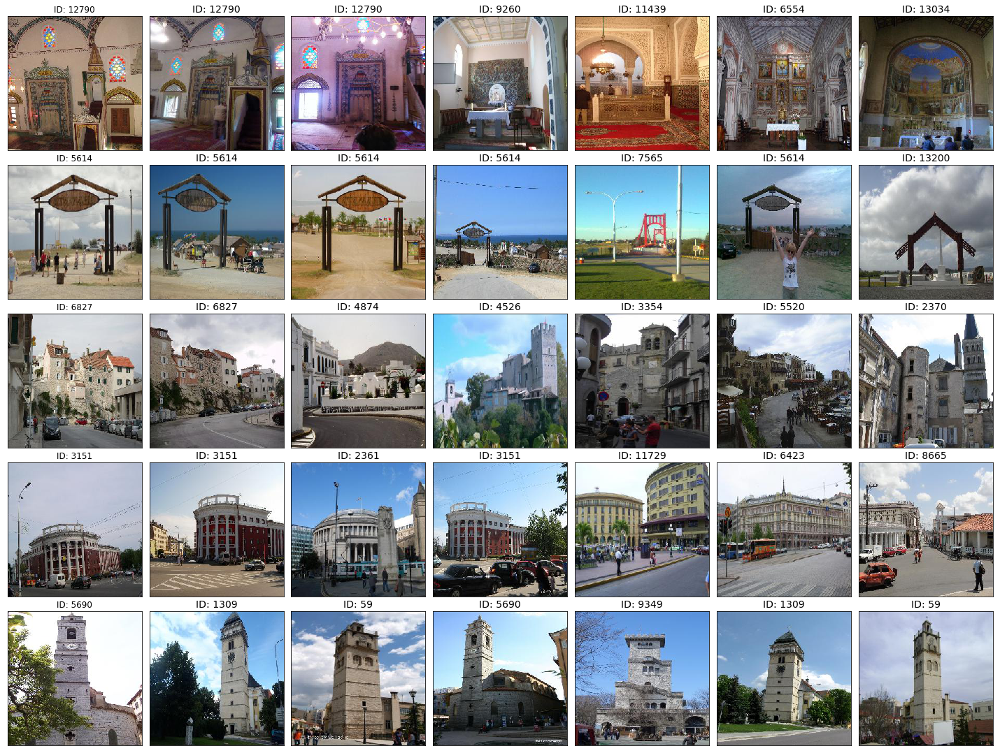

In [26]:
np.random.seed(6)
idxs = np.random.choice(range(len(test_df)), 10)

train_val_df = pd.concat((train_df, val_df), axis=0)
train_val_df = train_val_df.reset_index(drop=True)

# visualization
nrows = 5
ncols = 7
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
for i in range(nrows):
    index = idxs[i]
    test_img_id = test_df.loc[index, 'image_id']
    test_land_id = test_df.loc[index, 'landmark_id']
    test_img = plt.imread('./data/triplet/test/' + str(test_img_id) + '.jpg')
    ax[i][0].imshow(test_img)
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].axis('image')
    ax[i][0].set_title('ID: ' + str(test_land_id))
    neighbor_index = neighbor[index]
    for j in range(ncols - 1):
        tmp_img_id = train_val_df.loc[neighbor_index[j], 'image_id']
        tmp_land_id = train_val_df.loc[neighbor_index[j], 'landmark_id']
        if neighbor_index[j] < len(train_df):
            tmp_img = plt.imread('./data/triplet/train/' + str(tmp_img_id) + '.jpg')
        else:
            tmp_img = plt.imread('./data/triplet/validation/' + str(tmp_img_id) + '.jpg')
        ax[i][j + 1].imshow(tmp_img)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].axis('image')
        ax[i][j + 1].set_title('ID: ' + str(tmp_land_id), fontsize=14)
    
plt.tight_layout(pad=1, h_pad=0.5, w_pad=0)
fig.savefig('./result/images/result_3.pdf')
fig.savefig('./result/images/result_3.png', dpi=200)
plt.show()

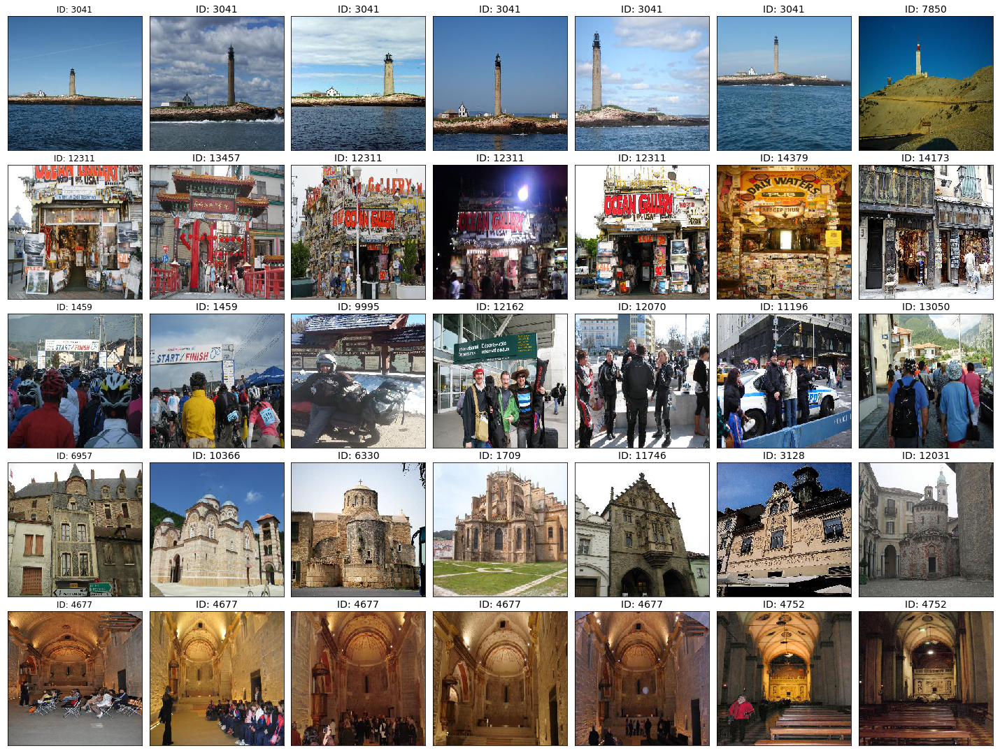

In [27]:
np.random.seed(8)
idxs = np.random.choice(range(len(test_df)), 10)

train_val_df = pd.concat((train_df, val_df), axis=0)
train_val_df = train_val_df.reset_index(drop=True)

# visualization
nrows = 5
ncols = 7
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
for i in range(nrows):
    index = idxs[i]
    test_img_id = test_df.loc[index, 'image_id']
    test_land_id = test_df.loc[index, 'landmark_id']
    test_img = plt.imread('./data/triplet/test/' + str(test_img_id) + '.jpg')
    ax[i][0].imshow(test_img)
    ax[i][0].set_xticks([])
    ax[i][0].set_yticks([])
    ax[i][0].axis('image')
    ax[i][0].set_title('ID: ' + str(test_land_id))
    neighbor_index = neighbor[index]
    for j in range(ncols - 1):
        tmp_img_id = train_val_df.loc[neighbor_index[j], 'image_id']
        tmp_land_id = train_val_df.loc[neighbor_index[j], 'landmark_id']
        if neighbor_index[j] < len(train_df):
            tmp_img = plt.imread('./data/triplet/train/' + str(tmp_img_id) + '.jpg')
        else:
            tmp_img = plt.imread('./data/triplet/validation/' + str(tmp_img_id) + '.jpg')
        ax[i][j + 1].imshow(tmp_img)
        ax[i][j + 1].set_xticks([])
        ax[i][j + 1].set_yticks([])
        ax[i][j + 1].axis('image')
        ax[i][j + 1].set_title('ID: ' + str(tmp_land_id), fontsize=14)
    
plt.tight_layout(pad=1, h_pad=0.5, w_pad=0)
fig.savefig('./result/images/result_4.pdf')
fig.savefig('./result/images/result_4.png', dpi=200)
plt.show()